In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
DATASET_PATH = "/content/drive/MyDrive/dataset1"
DATA_YAML_PATH = "/content/drive/MyDrive/dataset1/data.yaml"



In [4]:
!pip install ultralytics
from ultralytics import YOLO


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 914.9/914.9 kB 47.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 67.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 47.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 47.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 11.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 10.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 70.7 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstal

In [5]:
!pip install ultralytics opencv-python numpy scikit-learn


In [6]:
# Import Required Libraries
import cv2
import numpy as np
import os
import glob
import torch
from ultralytics import YOLO
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error

In [7]:
# Load YOLOv8 Pretrained Model
model = YOLO("yolov8s.pt")

# Train YOLO Model
model.train(
    data=DATA_YAML_PATH,
    epochs=50,
    imgsz=640,
    batch=16,
    device="cuda"
)


100%|██████████| 21.5M/21.5M [00:00<00:00, 199MB/s]


Ultralytics 8.3.70 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=/content/drive/MyDrive/dataset1/data.yaml, epochs=50, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=cuda, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=T

100%|██████████| 755k/755k [00:00<00:00, 55.4MB/s]


Overriding model.yaml nc=80 with nc=2

                   from  n    params  module                                       arguments                     
  0                  -1  1       928  ultralytics.nn.modules.conv.Conv             [3, 32, 3, 2]                 
  1                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  2                  -1  1     29056  ultralytics.nn.modules.block.C2f             [64, 64, 1, True]             
  3                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  4                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  5                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128, 256, 3, 2]              
  6                  -1  2    788480  ultralytics.nn.modules.block.C2f             [256, 256, 2, True]           
  7                  -1  1   1180672  ultralytics

100%|██████████| 5.35M/5.35M [00:00<00:00, 263MB/s]


AMP: checks passed ✅


train: Scanning /content/drive/MyDrive/dataset1/train/labels.cache... 568 images, 9 backgrounds, 0 corrupt: 100%|██████████| 568/568 [00:00<?, ?it/s]

WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 69, len(boxes) = 849. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


/usr/local/lib/python3.11/dist-packages/albumentations/__init__.py:24: UserWarning: A new version of Albumentations is available: 2.0.2 (you have 1.4.20). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
val: Scanning /content/drive/MyDrive/dataset1/valid/labels.cache... 53 images, 2 backgrounds, 0 corrupt: 100%|██████████| 53/53 [00:00<?, ?it/s]

WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 2, len(boxes) = 56. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001667, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      4.06G      1.269      2.528       1.68         25        640: 100%|██████████| 36/36 [00:43<00:00,  1.20s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.00it/s]

                   all         53         56      0.289      0.461      0.194      0.132



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      4.04G      1.146      1.727      1.613         24        640: 100%|██████████| 36/36 [00:16<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.22it/s]

                   all         53         56      0.681      0.504      0.498       0.24



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      4.01G      1.122      1.687      1.595         26        640: 100%|██████████| 36/36 [00:16<00:00,  2.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.23it/s]

                   all         53         56       0.24      0.306      0.307      0.215



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      4.05G      1.123      1.636      1.605         31        640: 100%|██████████| 36/36 [00:15<00:00,  2.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.13it/s]

                   all         53         56       0.41      0.454      0.349      0.219



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      4.05G      1.125      1.635      1.594         25        640: 100%|██████████| 36/36 [00:13<00:00,  2.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.13it/s]

                   all         53         56      0.878      0.518      0.612      0.492



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      4.04G      1.128      1.605      1.597         24        640: 100%|██████████| 36/36 [00:12<00:00,  2.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.18it/s]

                   all         53         56       0.41      0.547      0.449      0.372



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      4.03G      1.016       1.49      1.517         36        640: 100%|██████████| 36/36 [00:13<00:00,  2.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.60it/s]

                   all         53         56      0.741      0.567      0.558      0.445



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      4.05G       1.05      1.556      1.553         25        640: 100%|██████████| 36/36 [00:15<00:00,  2.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.33it/s]

                   all         53         56       0.54      0.503      0.506      0.381



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      4.06G      1.034      1.531      1.537         29        640: 100%|██████████| 36/36 [00:16<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.13it/s]

                   all         53         56      0.766       0.61      0.653      0.539



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      3.86G     0.9854      1.472      1.525         26        640: 100%|██████████| 36/36 [00:15<00:00,  2.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.16it/s]

                   all         53         56      0.596       0.67      0.554      0.425



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      4.06G     0.9915      1.448      1.495         28        640: 100%|██████████| 36/36 [00:16<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.61it/s]

                   all         53         56       0.77      0.611      0.693      0.598



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      4.03G      0.958        1.4      1.481         22        640: 100%|██████████| 36/36 [00:14<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.12it/s]

                   all         53         56          1      0.544      0.688      0.601



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      4.03G     0.9376      1.363      1.484         27        640: 100%|██████████| 36/36 [00:12<00:00,  2.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.22it/s]

                   all         53         56      0.939      0.621      0.711      0.621



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      4.05G     0.9879      1.426      1.495         25        640: 100%|██████████| 36/36 [00:13<00:00,  2.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.27it/s]

                   all         53         56      0.916      0.596      0.754      0.635



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      3.89G      1.003      1.449      1.515         33        640: 100%|██████████| 36/36 [00:14<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.79it/s]

                   all         53         56      0.829      0.637      0.712      0.607



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      4.02G      0.947      1.427      1.473         25        640: 100%|██████████| 36/36 [00:15<00:00,  2.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.26it/s]

                   all         53         56      0.871      0.639       0.75      0.636



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      4.03G     0.9624      1.395      1.473         27        640: 100%|██████████| 36/36 [00:15<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.79it/s]

                   all         53         56      0.951      0.596      0.709       0.56



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      4.05G     0.9444       1.41      1.477         27        640: 100%|██████████| 36/36 [00:14<00:00,  2.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.75it/s]

                   all         53         56      0.964      0.552        0.7      0.623



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      4.02G     0.8915      1.351      1.429         27        640: 100%|██████████| 36/36 [00:13<00:00,  2.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.14it/s]

                   all         53         56      0.934      0.562      0.678      0.576



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      4.04G      0.874      1.303      1.423         26        640: 100%|██████████| 36/36 [00:12<00:00,  2.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.55it/s]

                   all         53         56      0.901      0.591      0.764       0.64



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      4.05G     0.9034      1.332      1.452         25        640: 100%|██████████| 36/36 [00:13<00:00,  2.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.94it/s]

                   all         53         56      0.811      0.542      0.625      0.539



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      3.86G      0.973      1.341      1.482         29        640: 100%|██████████| 36/36 [00:15<00:00,  2.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.71it/s]

                   all         53         56      0.841      0.596      0.722      0.646



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      3.87G     0.8712      1.251      1.404         24        640: 100%|██████████| 36/36 [00:15<00:00,  2.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.99it/s]

                   all         53         56      0.935       0.61      0.711      0.624



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      4.03G     0.8557      1.254      1.385         19        640: 100%|██████████| 36/36 [00:16<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.06it/s]

                   all         53         56      0.826      0.598      0.698      0.613



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      4.05G     0.8305      1.195      1.381         24        640: 100%|██████████| 36/36 [00:16<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.23it/s]

                   all         53         56      0.905       0.59      0.737      0.649



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50         4G      0.841       1.24      1.392         36        640: 100%|██████████| 36/36 [00:15<00:00,  2.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.85it/s]

                   all         53         56       0.89      0.634      0.741      0.648



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      3.89G     0.8628      1.261      1.415         24        640: 100%|██████████| 36/36 [00:15<00:00,  2.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.26it/s]

                   all         53         56      0.824      0.596      0.673      0.598



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      4.03G     0.8501      1.232      1.404         27        640: 100%|██████████| 36/36 [00:14<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.20it/s]

                   all         53         56      0.852       0.63      0.741      0.633



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      4.03G     0.8113      1.202      1.362         31        640: 100%|██████████| 36/36 [00:13<00:00,  2.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.86it/s]

                   all         53         56      0.775      0.665      0.737      0.638



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      4.03G      0.853      1.243      1.399         23        640: 100%|██████████| 36/36 [00:13<00:00,  2.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.27it/s]

                   all         53         56      0.739      0.718      0.754      0.651



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      4.04G     0.8268      1.219      1.389         28        640: 100%|██████████| 36/36 [00:14<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.44it/s]

                   all         53         56      0.815      0.685      0.769      0.671



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      4.03G     0.8065      1.193      1.371         34        640: 100%|██████████| 36/36 [00:15<00:00,  2.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.14it/s]

                   all         53         56      0.775      0.663      0.739      0.655



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      4.05G     0.8287      1.237      1.387         16        640: 100%|██████████| 36/36 [00:16<00:00,  2.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.17it/s]

                   all         53         56      0.748      0.768      0.798       0.65



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      4.02G     0.7968       1.16      1.366         26        640: 100%|██████████| 36/36 [00:15<00:00,  2.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.41it/s]

                   all         53         56      0.713      0.719      0.737      0.644



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      3.92G     0.8079      1.121      1.355         35        640: 100%|██████████| 36/36 [00:15<00:00,  2.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.24it/s]

                   all         53         56      0.931      0.706      0.828       0.68



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50      4.03G     0.7898      1.154      1.339         29        640: 100%|██████████| 36/36 [00:13<00:00,  2.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.12it/s]

                   all         53         56      0.951      0.622      0.787      0.665



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      4.03G       0.87      1.214      1.399         22        640: 100%|██████████| 36/36 [00:12<00:00,  2.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.24it/s]

                   all         53         56      0.798      0.703      0.763      0.679



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      4.04G     0.8292      1.193      1.398         36        640: 100%|██████████| 36/36 [00:14<00:00,  2.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.52it/s]

                   all         53         56      0.891      0.596      0.732      0.653



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      3.87G     0.7428       1.12      1.312         27        640: 100%|██████████| 36/36 [00:14<00:00,  2.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.60it/s]

                   all         53         56      0.775      0.678      0.771      0.675



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50         4G     0.7295      1.076      1.319         23        640: 100%|██████████| 36/36 [00:15<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.29it/s]

                   all         53         56      0.874      0.715      0.782      0.684


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      4.05G     0.9765      1.458      1.602          9        640: 100%|██████████| 36/36 [00:16<00:00,  2.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.82it/s]

                   all         53         56      0.788      0.692      0.758      0.659



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50      4.03G     0.9081      1.258      1.556         20        640: 100%|██████████| 36/36 [00:15<00:00,  2.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.51it/s]

                   all         53         56      0.762      0.703      0.777      0.669



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      4.04G     0.8827      1.174      1.528          8        640: 100%|██████████| 36/36 [00:14<00:00,  2.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.52it/s]

                   all         53         56      0.795      0.664      0.786      0.681



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      4.03G     0.8557      1.157      1.506         14        640: 100%|██████████| 36/36 [00:12<00:00,  2.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.22it/s]

                   all         53         56      0.899      0.598      0.755      0.664



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      4.02G     0.8227      1.129      1.484          8        640: 100%|██████████| 36/36 [00:12<00:00,  2.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.74it/s]

                   all         53         56      0.796      0.737      0.792      0.672



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      3.88G     0.8468      1.118      1.484         10        640: 100%|██████████| 36/36 [00:14<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.08it/s]

                   all         53         56      0.876      0.705      0.794       0.69



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      3.87G     0.8242      1.135      1.477         10        640: 100%|██████████| 36/36 [00:15<00:00,  2.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.21it/s]

                   all         53         56      0.894      0.684      0.804      0.689



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      4.02G     0.8109      1.101      1.468          8        640: 100%|██████████| 36/36 [00:15<00:00,  2.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.80it/s]

                   all         53         56      0.835      0.714      0.792      0.686



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      4.05G     0.7934      1.076      1.446          8        640: 100%|██████████| 36/36 [00:14<00:00,  2.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.62it/s]

                   all         53         56       0.88      0.698      0.787      0.682



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      4.04G     0.8251      1.078      1.475          8        640: 100%|██████████| 36/36 [00:12<00:00,  2.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.30it/s]

                   all         53         56      0.828      0.728      0.788       0.68



50 epochs completed in 0.248 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 22.5MB
Optimizer stripped from runs/detect/train/weights/best.pt, 22.5MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.70 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 168 layers, 11,126,358 parameters, 0 gradients, 28.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.63it/s]


                   all         53         56      0.876      0.705      0.794       0.69
            Rough Wall         38         38      0.856      0.632      0.715      0.564
           Smooth Wall         18         18      0.897      0.778      0.873      0.816
Speed: 0.3ms preprocess, 4.8ms inference, 0.0ms loss, 4.0ms postprocess per image
Results saved to runs/detect/train


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7c3d4ca24710>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.04804


image 1/1 /content/test4.jpeg: 480x640 1 Rough Wall, 1 Smooth Wall, 45.1ms
Speed: 2.1ms preprocess, 45.1ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 640)


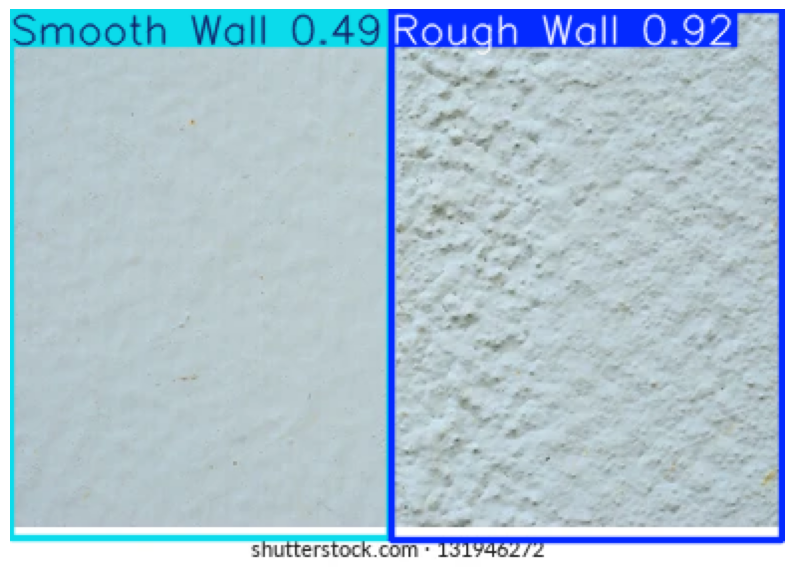

In [8]:
from ultralytics import YOLO
import cv2
import matplotlib.pyplot as plt

# Load the trained YOLOv8 model
model = YOLO("/content/runs/detect/train/weights/best.pt")

# Test on a sample image
test_image_path = "/content/test4.jpeg"
results = model(test_image_path)

# Show prediction
for r in results:
    im_array = r.plot()  # Plot the results
    plt.figure(figsize=(10, 10))
    plt.imshow(cv2.cvtColor(im_array, cv2.COLOR_BGR2RGB))
    plt.axis("off")
    plt.show()


In [9]:
import cv2
import numpy as np
from skimage.filters import gabor

def compute_texture_features(image):
    """Compute Edge Density, Contour Complexity, and Gabor Features."""
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Edge Density (Canny Edge Detector)
    edges = cv2.Canny(gray, 100, 200)
    edge_density = np.sum(edges) / (image.shape[0] * image.shape[1])

    # Contour Complexity
    contours, _ = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    contour_complexity = len(contours)

    # Gabor Features
    gabor_responses = []
    frequencies = [0.1, 0.3, 0.5]
    orientations = [0, 45, 90, 135]
    for frequency in frequencies:
        for orientation in orientations:
            filt_real, _ = gabor(gray, frequency=frequency, theta=np.deg2rad(orientation))
            gabor_responses.append(filt_real)
    gabor_mean = np.mean(np.stack(gabor_responses, axis=0), axis=0)

    return edge_density, contour_complexity, np.std(gabor_mean)

def compute_smoothness_score(image):
    """Calculate a normalized smoothness score (0-100)."""
    edge_density, contour_complexity, gabor_std = compute_texture_features(image)

    # Normalize each feature
    edge_norm = min(edge_density * 50, 100)
    contour_norm = min((contour_complexity / 2500) * 100, 100)
    gabor_norm = min(gabor_std * 10, 100)

    # Weighted Sum Formula for Smoothness Score
    smoothness_score = 100 - (0.4 * edge_norm + 0.3 * contour_norm + 0.3 * gabor_norm)

    # Clamp the score to the range 0-100
    smoothness_score = max(0, min(100, smoothness_score))

    return edge_density, contour_complexity, gabor_std, smoothness_score

# Example usage
image_path = "/test4.jpeg"  # Ensure correct path
image = cv2.imread(image_path)

if image is not None:
    edge_density, contour_complexity, gabor_std, smoothness_score = compute_smoothness_score(image)

    # Output the results
    print(f"Edges: {edge_density}")
    print(f"Contour Complexity: {contour_complexity}")
    print(f"Gabor Std: {gabor_std}")
    print(f"Smoothness Score: {smoothness_score:.3f}")
else:
    print(f"Error: Image not found at {image_path}")



Edges: 0.10767535806096218
Contour Complexity: 321
Gabor Std: 29.755479937213895
Smoothness Score: 63.994



image 1/1 /content/drive/MyDrive/dataset1/test/images/20240122_102044_jpg.rf.a8e92218909ffec2457863c10631beb7.jpg: 640x640 1 Smooth Wall, 16.3ms
Speed: 2.9ms preprocess, 16.3ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


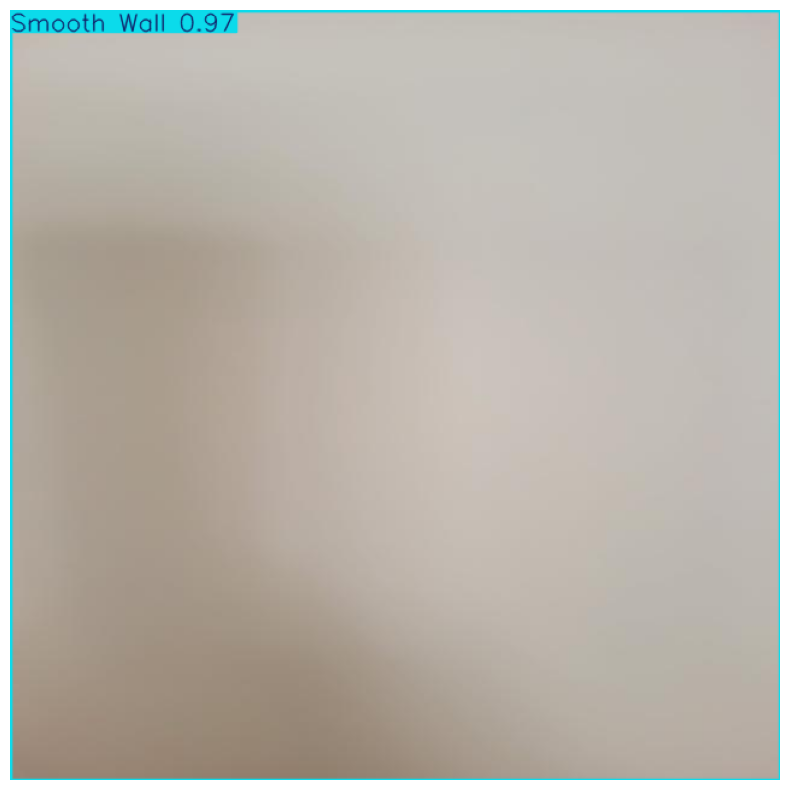

Image: 20240122_102044_jpg.rf.a8e92218909ffec2457863c10631beb7.jpg
Edges: 0.36634033203125
Contour Complexity: 2
Gabor Std: 0.004447488154422404
Smoothness Score: 90.809

Surface Category: The surface is smooth with minimal imperfections. No further corrections are needed. The surface is ready for finishing or painting.


image 1/1 /content/drive/MyDrive/dataset1/test/images/20240122_102135_009_saved_jpg.rf.5e13942a261b93734668ac023f5eafa1.jpg: 640x640 1 Smooth Wall, 16.3ms
Speed: 2.0ms preprocess, 16.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


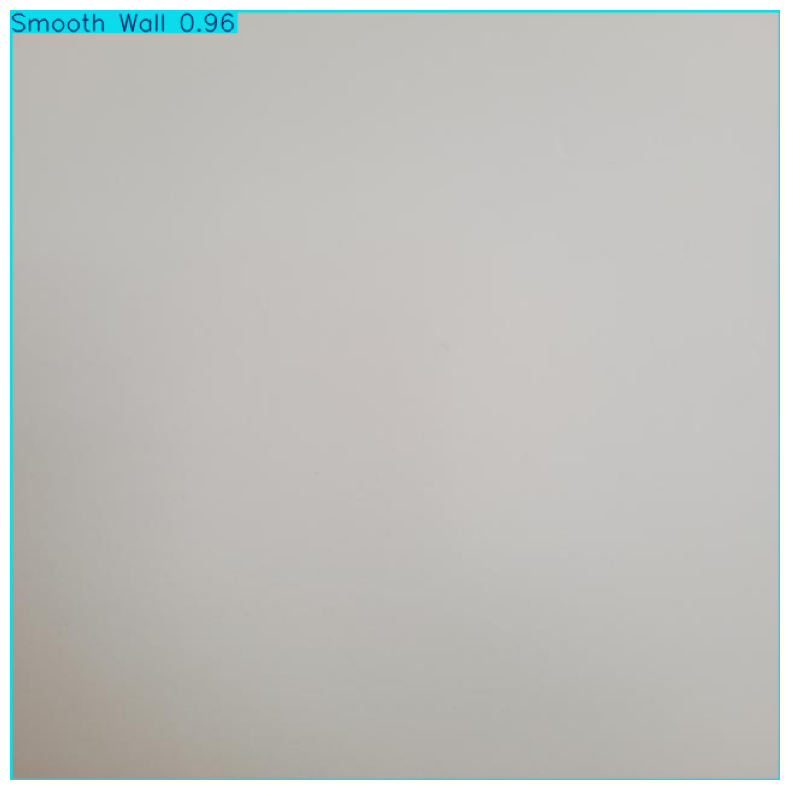

Image: 20240122_102135_009_saved_jpg.rf.5e13942a261b93734668ac023f5eafa1.jpg
Edges: 0.2474169921875
Contour Complexity: 5
Gabor Std: 0.005526064903403373
Smoothness Score: 93.744

Surface Category: The surface is smooth with minimal imperfections. No further corrections are needed. The surface is ready for finishing or painting.


image 1/1 /content/drive/MyDrive/dataset1/test/images/20240122_103650_009_saved_jpg.rf.98d591ab660e8dc48bb9f22416700f67.jpg: 640x640 1 Rough Wall, 16.4ms
Speed: 2.1ms preprocess, 16.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


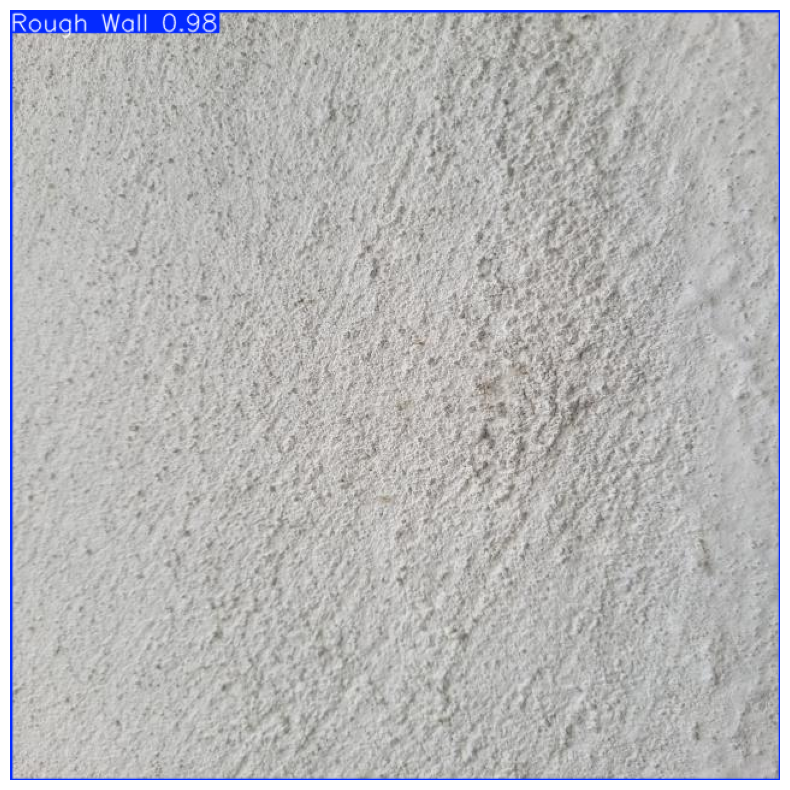

Image: 20240122_103650_009_saved_jpg.rf.98d591ab660e8dc48bb9f22416700f67.jpg
Edges: 23.355546875
Contour Complexity: 355
Gabor Std: 39.22354617633636
Smoothness Score: 25.740

Surface Category: Significant surface roughness detected. Multiple coats of paint and smoothing are recommended to achieve a smooth, even finish.


image 1/1 /content/drive/MyDrive/dataset1/test/images/IMG_7084_JPG.rf.6ba10ff04765fcb7813d17737ac46f5b.jpg: 640x640 (no detections), 17.1ms
Speed: 2.9ms preprocess, 17.1ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)


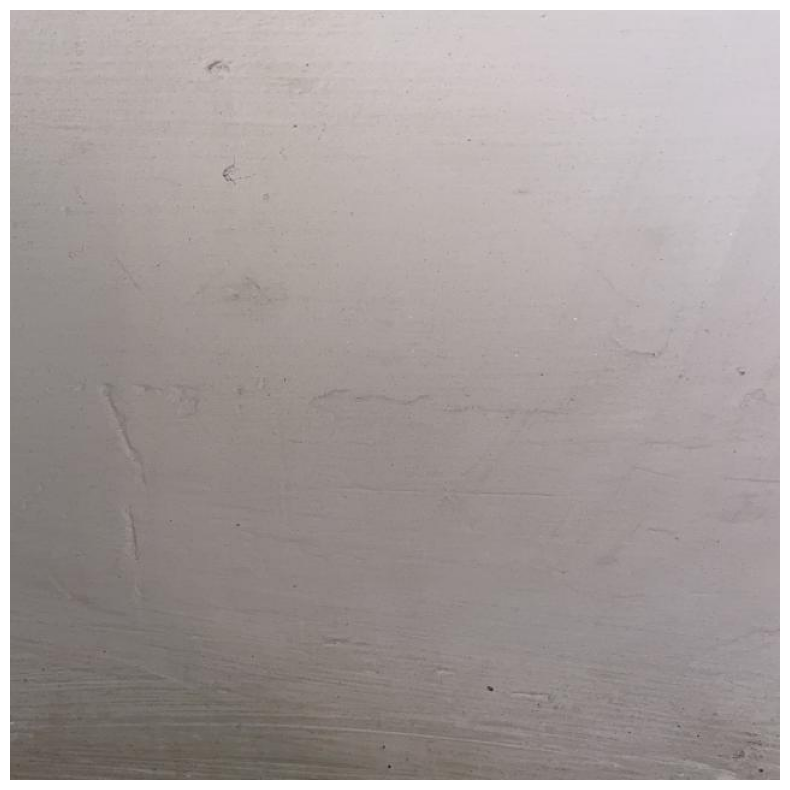

Image: IMG_7084_JPG.rf.6ba10ff04765fcb7813d17737ac46f5b.jpg
Edges: 3.07281005859375
Contour Complexity: 276
Gabor Std: 6.957156268567657
Smoothness Score: 32.774

Surface Category: Significant surface roughness detected. Multiple coats of paint and smoothing are recommended to achieve a smooth, even finish.


image 1/1 /content/drive/MyDrive/dataset1/test/images/IMG_7065_JPG.rf.bae28649e9fd4dda8e12b4d1c029a0f1.jpg: 640x640 1 Rough Wall, 1 Smooth Wall, 16.4ms
Speed: 3.1ms preprocess, 16.4ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


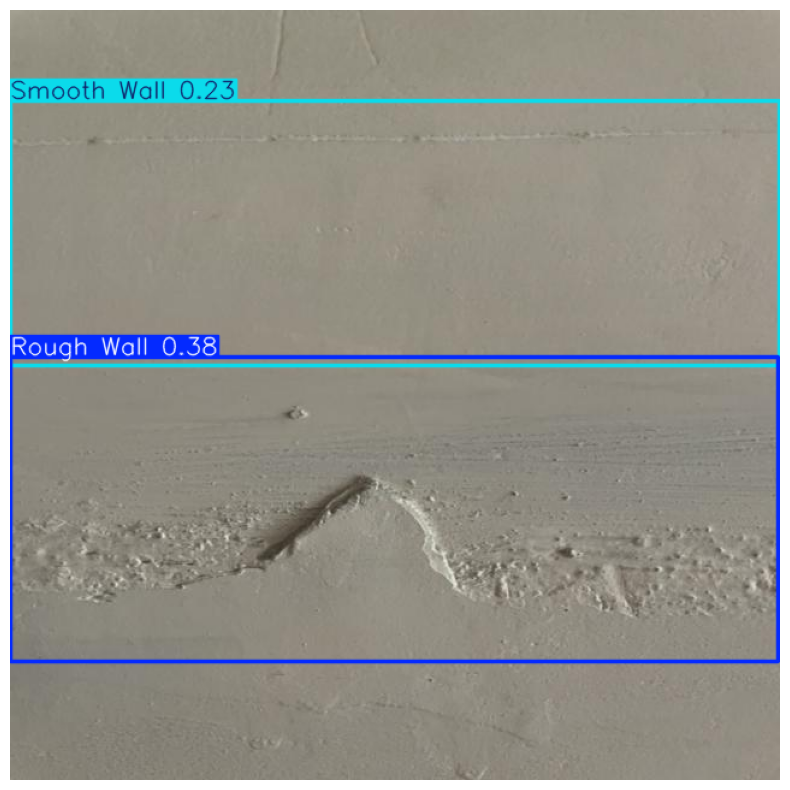

Image: IMG_7065_JPG.rf.bae28649e9fd4dda8e12b4d1c029a0f1.jpg
Edges: 3.7293212890625
Contour Complexity: 1258
Gabor Std: 14.435989761803873
Smoothness Score: 14.904

Surface Category: Significant surface roughness detected. Multiple coats of paint and smoothing are recommended to achieve a smooth, even finish.


image 1/1 /content/drive/MyDrive/dataset1/test/images/20240122_102229_002_saved_jpg.rf.1b172bbb482bfedff5d3d13373623185.jpg: 640x640 1 Smooth Wall, 16.4ms
Speed: 2.9ms preprocess, 16.4ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


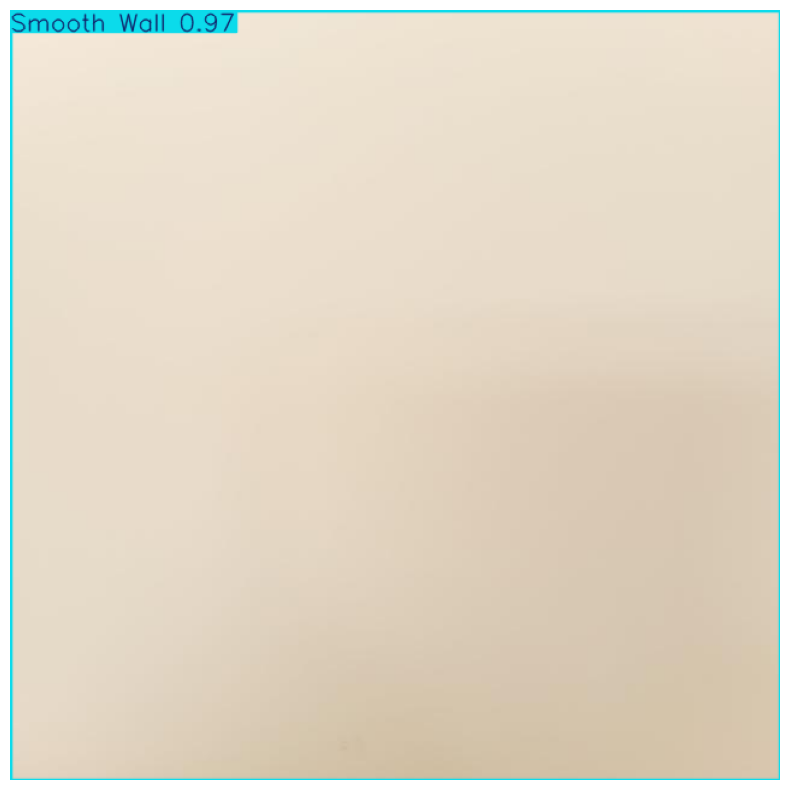

Image: 20240122_102229_002_saved_jpg.rf.1b172bbb482bfedff5d3d13373623185.jpg
Edges: 0.18016845703125
Contour Complexity: 2
Gabor Std: 0.019628670066310885
Smoothness Score: 95.433

Surface Category: The surface is smooth with minimal imperfections. No further corrections are needed. The surface is ready for finishing or painting.


image 1/1 /content/drive/MyDrive/dataset1/test/images/20240122_102445_007_saved-1-_jpg.rf.8c31cc04421472155e6827f2cc1bdcf0.jpg: 640x640 1 Smooth Wall, 22.3ms
Speed: 5.2ms preprocess, 22.3ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)


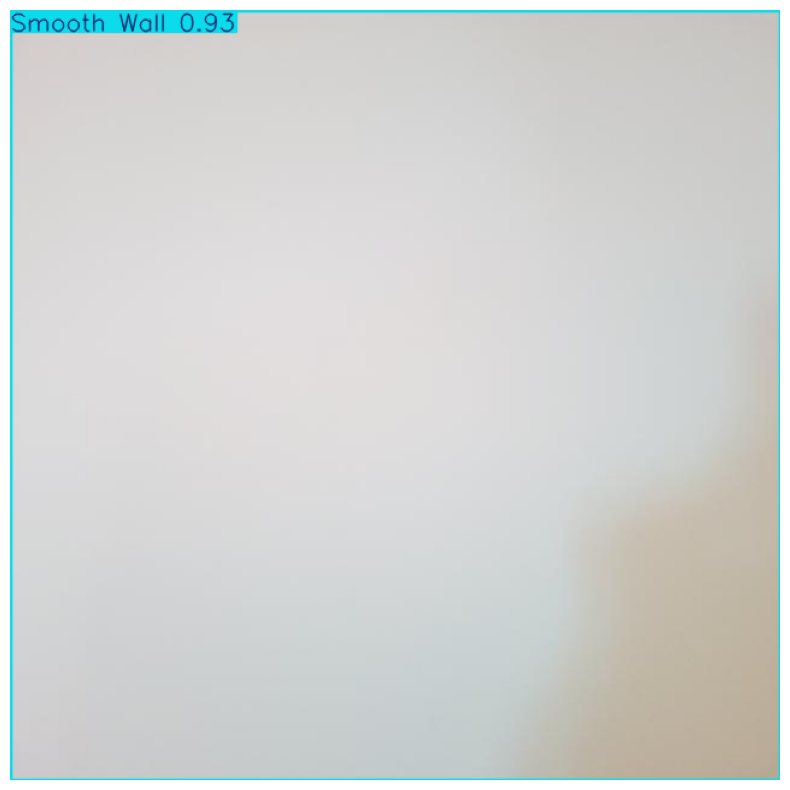

Image: 20240122_102445_007_saved-1-_jpg.rf.8c31cc04421472155e6827f2cc1bdcf0.jpg
Edges: 0.2628759765625
Contour Complexity: 2
Gabor Std: 0.018444258604838358
Smoothness Score: 93.367

Surface Category: The surface is smooth with minimal imperfections. No further corrections are needed. The surface is ready for finishing or painting.


image 1/1 /content/drive/MyDrive/dataset1/test/images/20240122_102027_jpg.rf.59f76500a3a46330ed116c9188b1d5a0.jpg: 640x640 1 Smooth Wall, 16.4ms
Speed: 3.0ms preprocess, 16.4ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


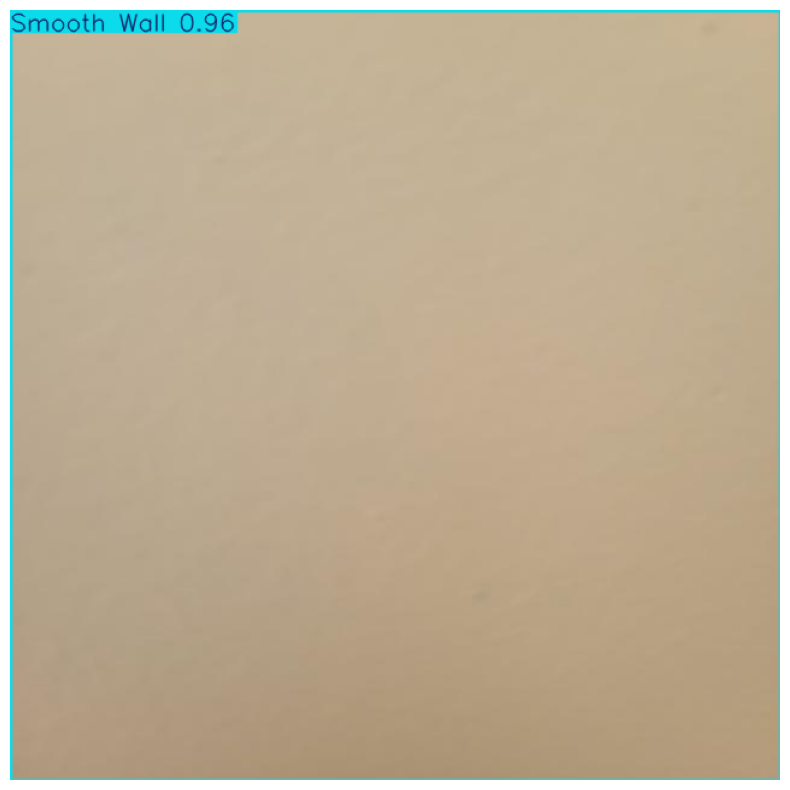

Image: 20240122_102027_jpg.rf.59f76500a3a46330ed116c9188b1d5a0.jpg
Edges: 0.368408203125
Contour Complexity: 13
Gabor Std: 0.005769905262300776
Smoothness Score: 90.622

Surface Category: The surface is smooth with minimal imperfections. No further corrections are needed. The surface is ready for finishing or painting.


image 1/1 /content/drive/MyDrive/dataset1/test/images/20240122_102810_003_saved-1-_jpg.rf.814fddd52168b6ff41f2ceeb03f79be2.jpg: 640x640 1 Rough Wall, 16.4ms
Speed: 2.9ms preprocess, 16.4ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


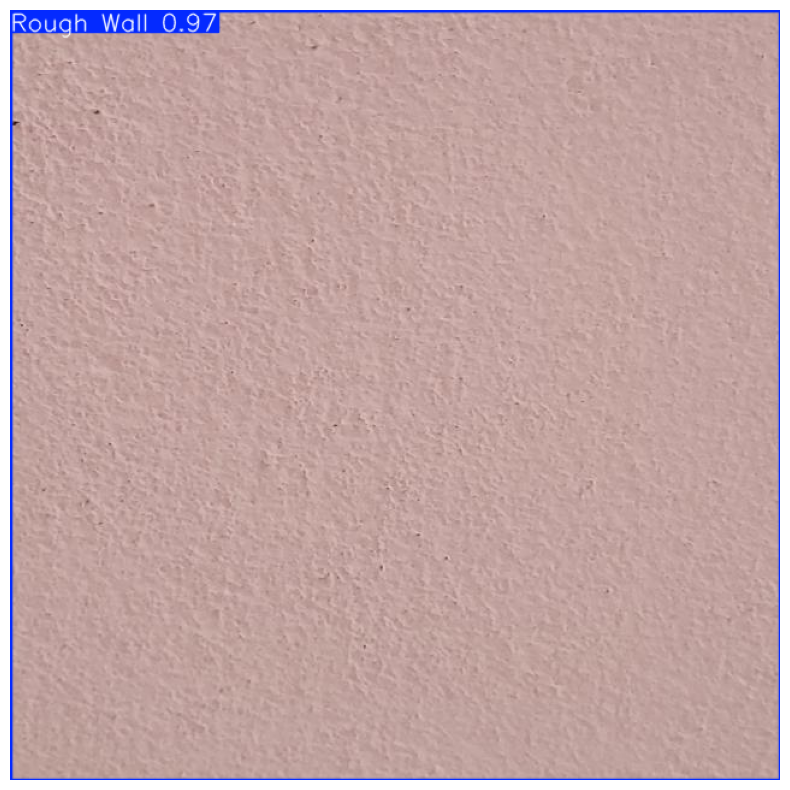

Image: 20240122_102810_003_saved-1-_jpg.rf.814fddd52168b6ff41f2ceeb03f79be2.jpg
Edges: 6.659462890625
Contour Complexity: 1010
Gabor Std: 14.419272510752833
Smoothness Score: 17.880

Surface Category: Significant surface roughness detected. Multiple coats of paint and smoothing are recommended to achieve a smooth, even finish.


image 1/1 /content/drive/MyDrive/dataset1/test/images/20240122_101945_jpg.rf.270ceda6f42067feebe10de7e8755a09.jpg: 640x640 1 Smooth Wall, 16.4ms
Speed: 2.8ms preprocess, 16.4ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)


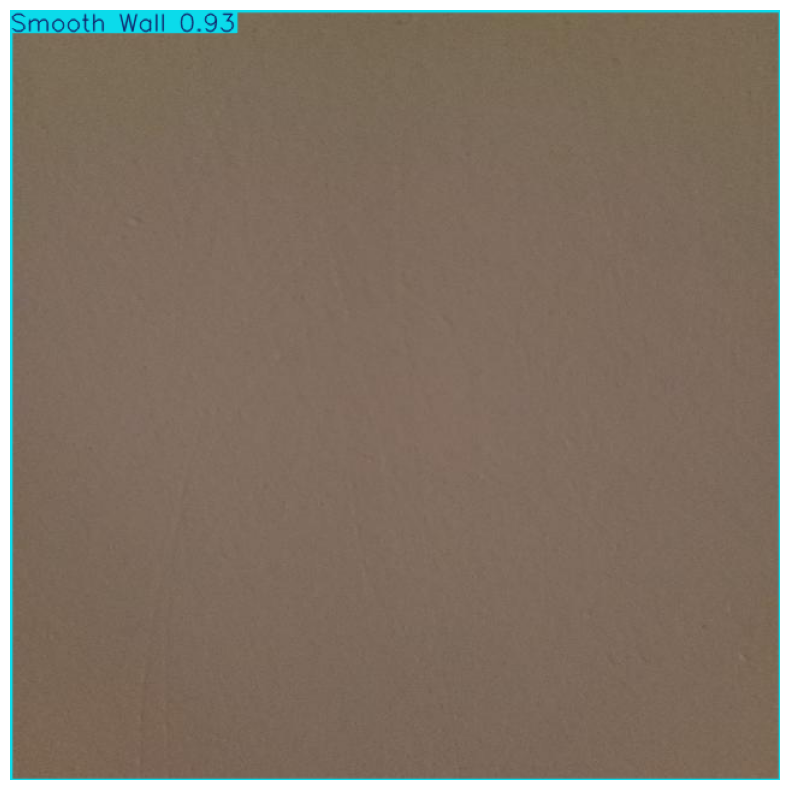

Image: 20240122_101945_jpg.rf.270ceda6f42067feebe10de7e8755a09.jpg
Edges: 2.16563232421875
Contour Complexity: 2845
Gabor Std: 0.6722371888892965
Smoothness Score: 18.656

Surface Category: Significant surface roughness detected. Multiple coats of paint and smoothing are recommended to achieve a smooth, even finish.


image 1/1 /content/drive/MyDrive/dataset1/test/images/20240122_102509-0-_jpg.rf.e8530692029dcd9be0a7886799e7b11f.jpg: 640x640 1 Rough Wall, 16.4ms
Speed: 3.1ms preprocess, 16.4ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


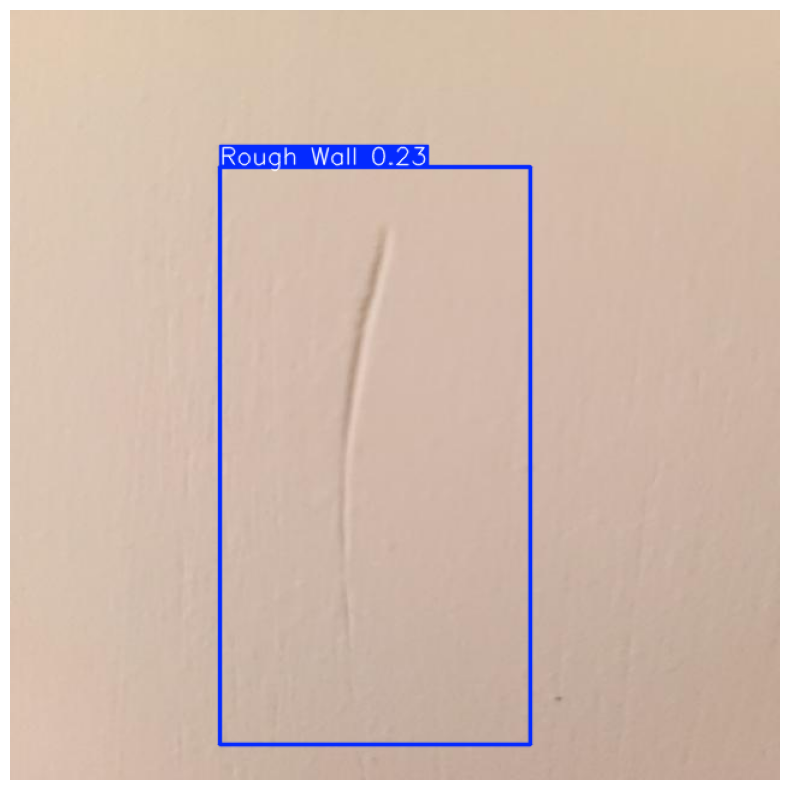

Image: 20240122_102509-0-_jpg.rf.e8530692029dcd9be0a7886799e7b11f.jpg
Edges: 0.90660888671875
Contour Complexity: 150
Gabor Std: 1.9745389414001087
Smoothness Score: 71.586

Surface Category: Surface exhibits mild roughness. A single coat of paint or light smoothing should be sufficient for an acceptable finish.


image 1/1 /content/drive/MyDrive/dataset1/test/images/20240122_102205_jpg.rf.7e014af095b52a00598f271c2e9d819f.jpg: 640x640 1 Rough Wall, 16.4ms
Speed: 2.9ms preprocess, 16.4ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


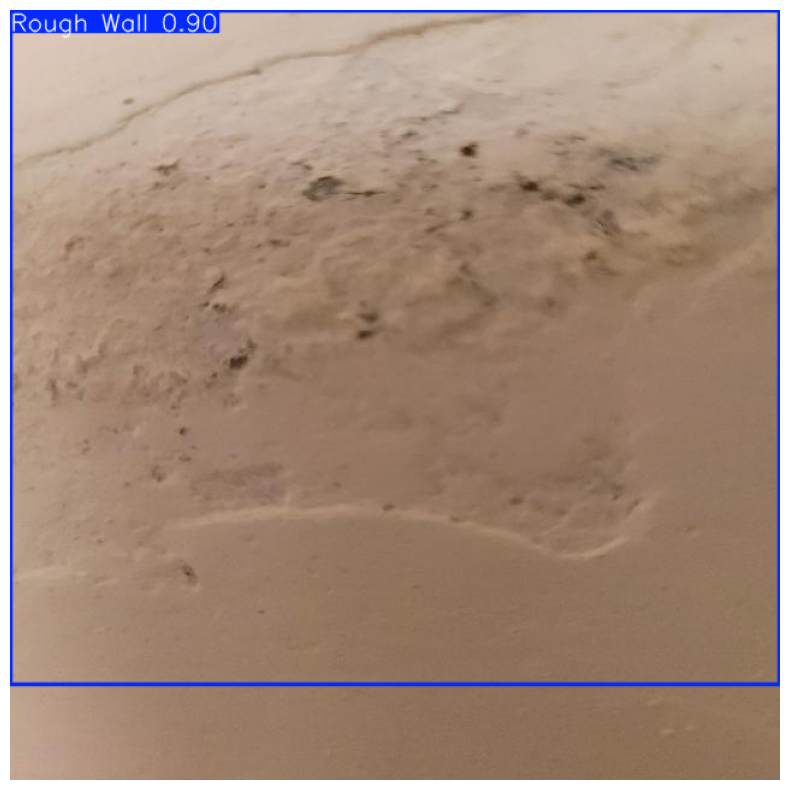

Image: 20240122_102205_jpg.rf.7e014af095b52a00598f271c2e9d819f.jpg
Edges: 2.32873779296875
Contour Complexity: 166
Gabor Std: 8.270576254793792
Smoothness Score: 31.467

Surface Category: Significant surface roughness detected. Multiple coats of paint and smoothing are recommended to achieve a smooth, even finish.


image 1/1 /content/drive/MyDrive/dataset1/test/images/20240122_103650_005_saved_jpg.rf.cff0429be0219a7d3d872b34551e5c32.jpg: 640x640 1 Rough Wall, 16.4ms
Speed: 4.1ms preprocess, 16.4ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


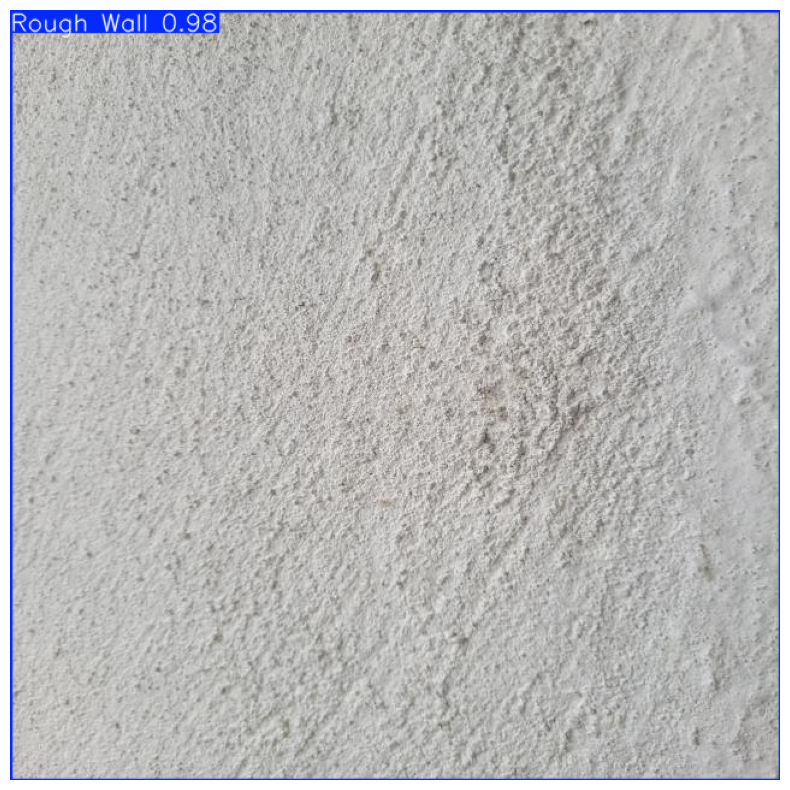

Image: 20240122_103650_005_saved_jpg.rf.cff0429be0219a7d3d872b34551e5c32.jpg
Edges: 23.149931640625
Contour Complexity: 371
Gabor Std: 39.03101947222617
Smoothness Score: 25.548

Surface Category: Significant surface roughness detected. Multiple coats of paint and smoothing are recommended to achieve a smooth, even finish.


image 1/1 /content/drive/MyDrive/dataset1/test/images/IMG_7127_JPG.rf.1aa6142dcd9b837e7263d021a96af83e.jpg: 640x640 1 Rough Wall, 16.5ms
Speed: 2.9ms preprocess, 16.5ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


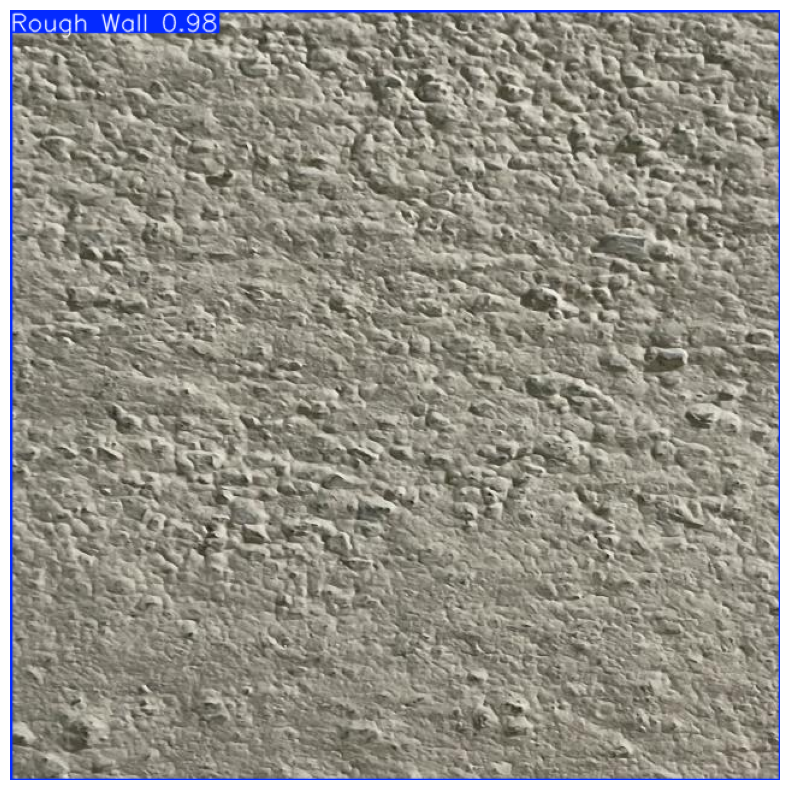

Image: IMG_7127_JPG.rf.1aa6142dcd9b837e7263d021a96af83e.jpg
Edges: 26.805048828125
Contour Complexity: 1223
Gabor Std: 40.43318374327929
Smoothness Score: 15.324

Surface Category: Significant surface roughness detected. Multiple coats of paint and smoothing are recommended to achieve a smooth, even finish.


image 1/1 /content/drive/MyDrive/dataset1/test/images/20240122_102445_006_saved-1-_jpg.rf.a046cdf079682ba1de59cf9768e33a9e.jpg: 640x640 1 Smooth Wall, 16.4ms
Speed: 2.9ms preprocess, 16.4ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)


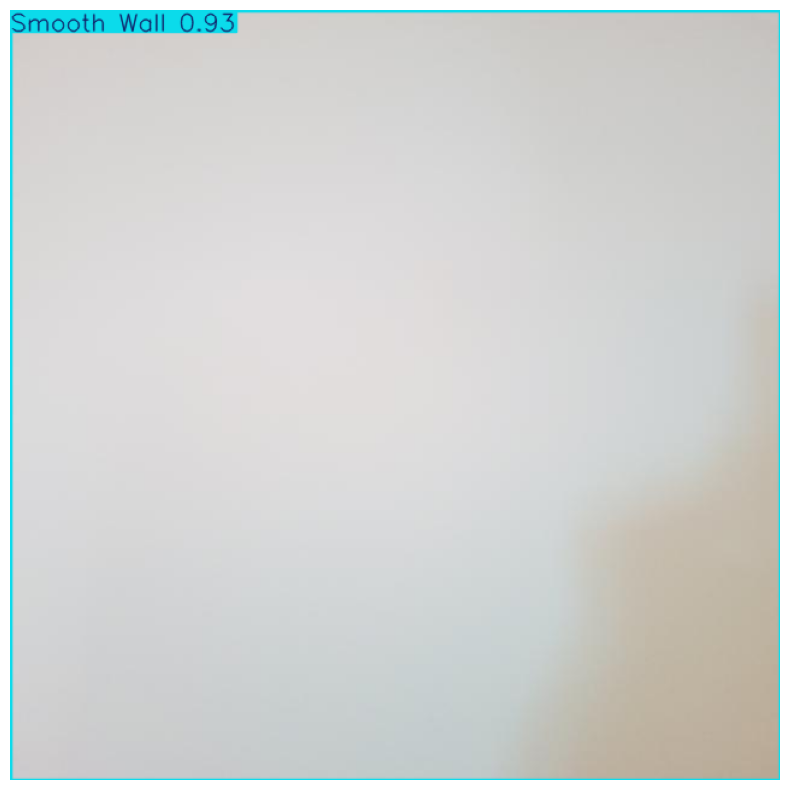

Image: 20240122_102445_006_saved-1-_jpg.rf.a046cdf079682ba1de59cf9768e33a9e.jpg
Edges: 0.26478515625
Contour Complexity: 6
Gabor Std: 0.01844066183274756
Smoothness Score: 93.271

Surface Category: The surface is smooth with minimal imperfections. No further corrections are needed. The surface is ready for finishing or painting.


image 1/1 /content/drive/MyDrive/dataset1/test/images/20240122_102135_008_saved_jpg.rf.aa732a313df5abad10dfcde0b6f10f0f.jpg: 640x640 1 Smooth Wall, 17.3ms
Speed: 2.9ms preprocess, 17.3ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


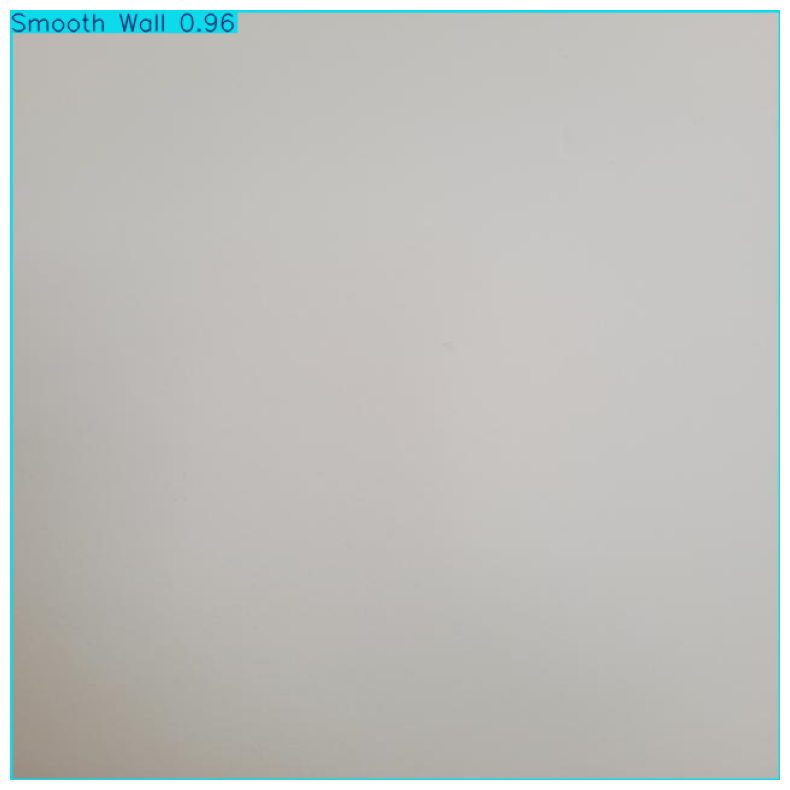

Image: 20240122_102135_008_saved_jpg.rf.aa732a313df5abad10dfcde0b6f10f0f.jpg
Edges: 0.2454296875
Contour Complexity: 6
Gabor Std: 0.005472553671227117
Smoothness Score: 93.781

Surface Category: The surface is smooth with minimal imperfections. No further corrections are needed. The surface is ready for finishing or painting.


image 1/1 /content/drive/MyDrive/dataset1/test/images/20240122_101914_jpg.rf.0b980054143a41916fa836a96654922d.jpg: 640x640 1 Smooth Wall, 16.4ms
Speed: 3.0ms preprocess, 16.4ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


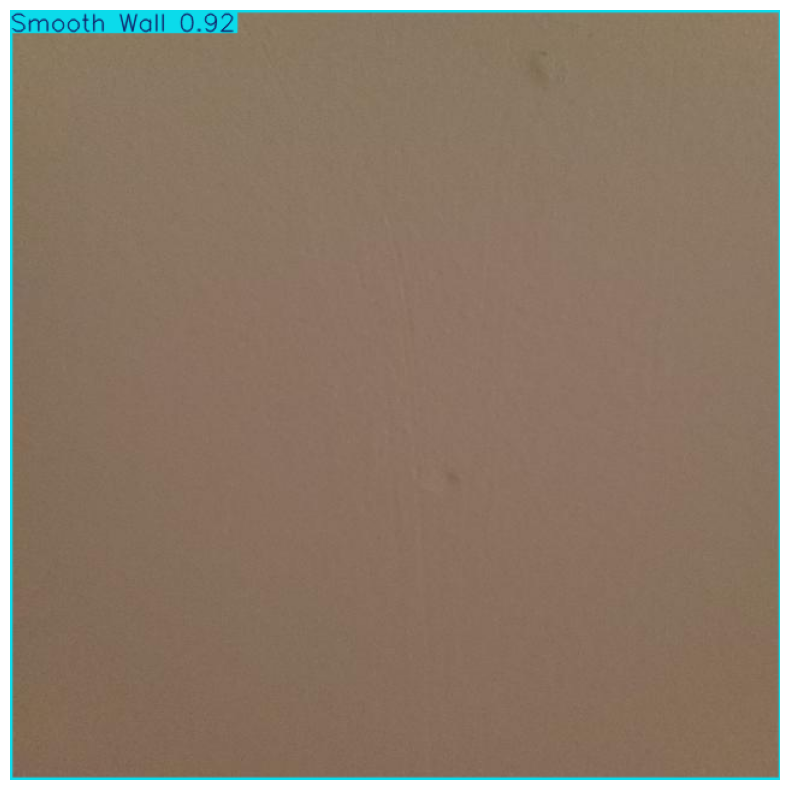

Image: 20240122_101914_jpg.rf.0b980054143a41916fa836a96654922d.jpg
Edges: 1.8892626953125
Contour Complexity: 1083
Gabor Std: 0.39727953401832206
Smoothness Score: 38.978

Surface Category: Significant surface roughness detected. Multiple coats of paint and smoothing are recommended to achieve a smooth, even finish.


image 1/1 /content/drive/MyDrive/dataset1/test/images/20240122_103051_jpg.rf.f023f8041f19400d69d790849d413db3.jpg: 640x640 (no detections), 16.4ms
Speed: 2.9ms preprocess, 16.4ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)


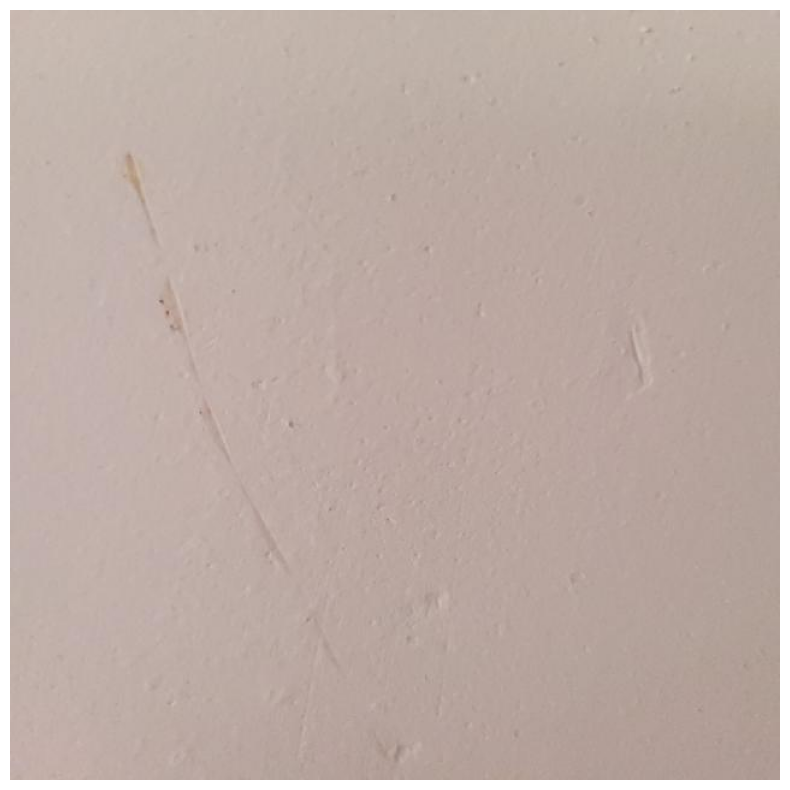

Image: 20240122_103051_jpg.rf.f023f8041f19400d69d790849d413db3.jpg
Edges: 1.74537353515625
Contour Complexity: 954
Gabor Std: 2.7591714882256166
Smoothness Score: 39.399

Surface Category: Significant surface roughness detected. Multiple coats of paint and smoothing are recommended to achieve a smooth, even finish.


image 1/1 /content/drive/MyDrive/dataset1/test/images/20240122_102640_jpg.rf.364ada9536641e0975be465917bf1bf9.jpg: 640x640 1 Rough Wall, 16.4ms
Speed: 2.9ms preprocess, 16.4ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


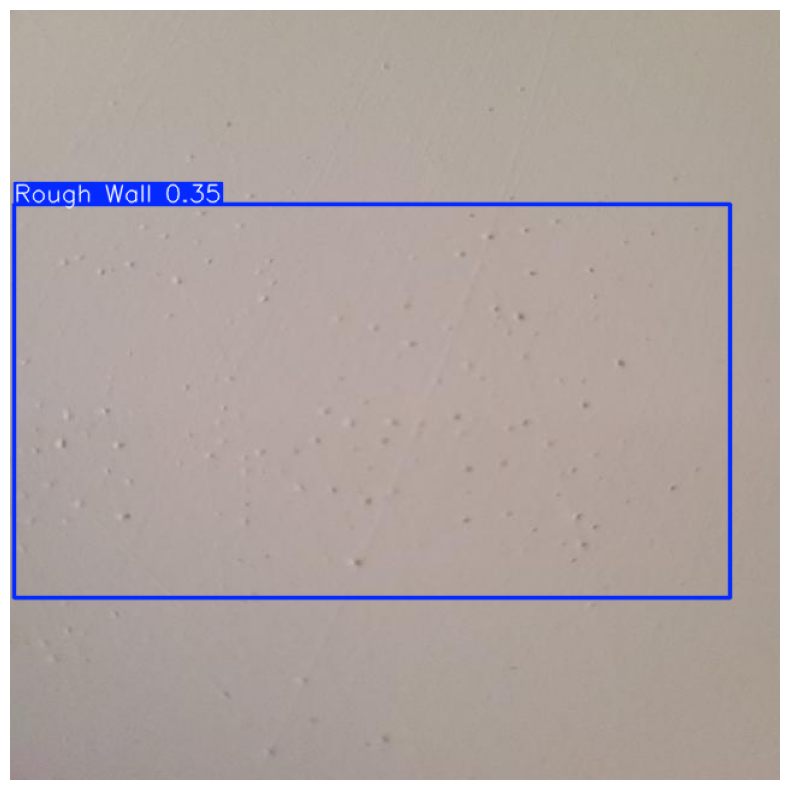

Image: 20240122_102640_jpg.rf.364ada9536641e0975be465917bf1bf9.jpg
Edges: 1.26104736328125
Contour Complexity: 353
Gabor Std: 3.271331555071171
Smoothness Score: 57.695

Surface Category: The surface shows moderate roughness. Two coats of paint or some level of smoothing may be required to ensure a satisfactory finish.


image 1/1 /content/drive/MyDrive/dataset1/test/images/20240122_102810_002_saved-1-_jpg.rf.760ff9ba066fa7e772a7c1e4ad962ffb.jpg: 640x640 1 Rough Wall, 16.4ms
Speed: 3.9ms preprocess, 16.4ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


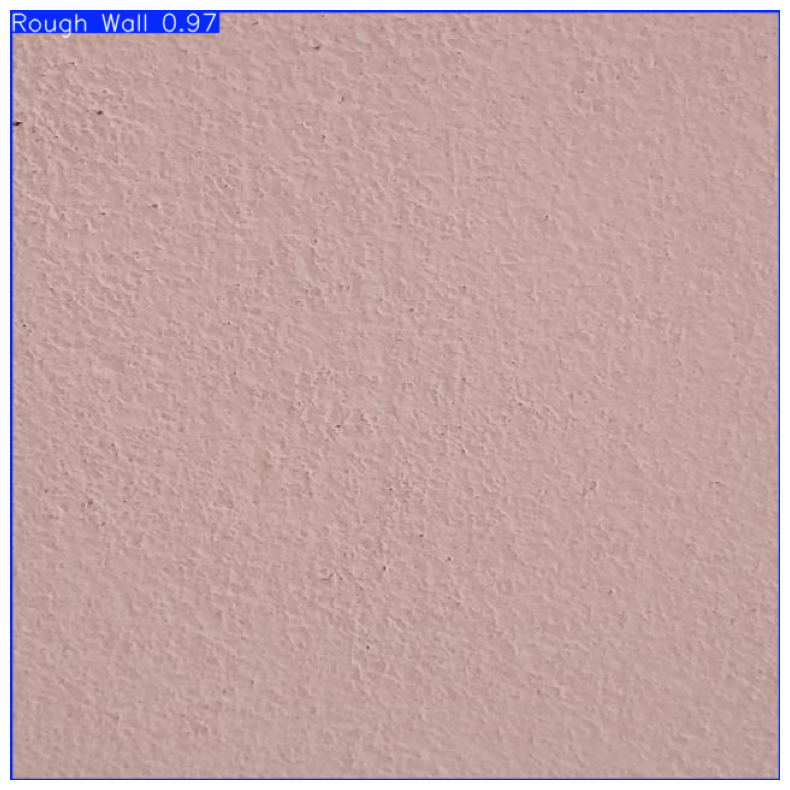

Image: 20240122_102810_002_saved-1-_jpg.rf.760ff9ba066fa7e772a7c1e4ad962ffb.jpg
Edges: 6.96534423828125
Contour Complexity: 1072
Gabor Std: 15.00754363729483
Smoothness Score: 17.136

Surface Category: Significant surface roughness detected. Multiple coats of paint and smoothing are recommended to achieve a smooth, even finish.


image 1/1 /content/drive/MyDrive/dataset1/test/images/20240122_103720_jpg.rf.bce5266a6a5181088e4790018786b06b.jpg: 640x640 1 Rough Wall, 16.4ms
Speed: 2.9ms preprocess, 16.4ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


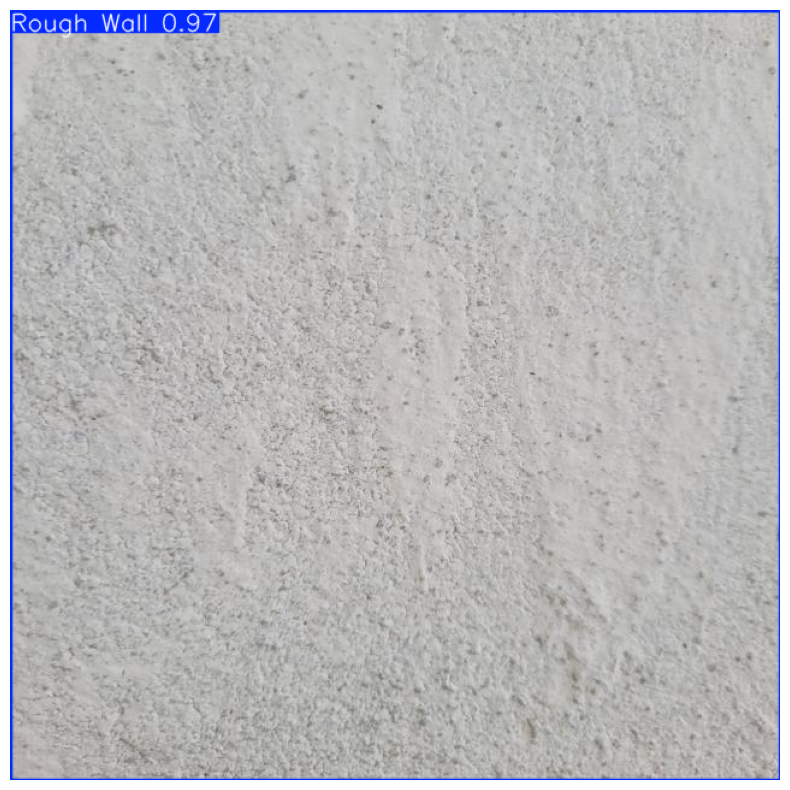

Image: 20240122_103720_jpg.rf.bce5266a6a5181088e4790018786b06b.jpg
Edges: 11.67079833984375
Contour Complexity: 836
Gabor Std: 28.177620462288473
Smoothness Score: 19.968

Surface Category: Significant surface roughness detected. Multiple coats of paint and smoothing are recommended to achieve a smooth, even finish.


image 1/1 /content/drive/MyDrive/dataset1/test/images/IMG_7090_JPG.rf.da4cb3da033cd9070dffdac4938bb646.jpg: 640x640 1 Rough Wall, 1 Smooth Wall, 16.4ms
Speed: 3.0ms preprocess, 16.4ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


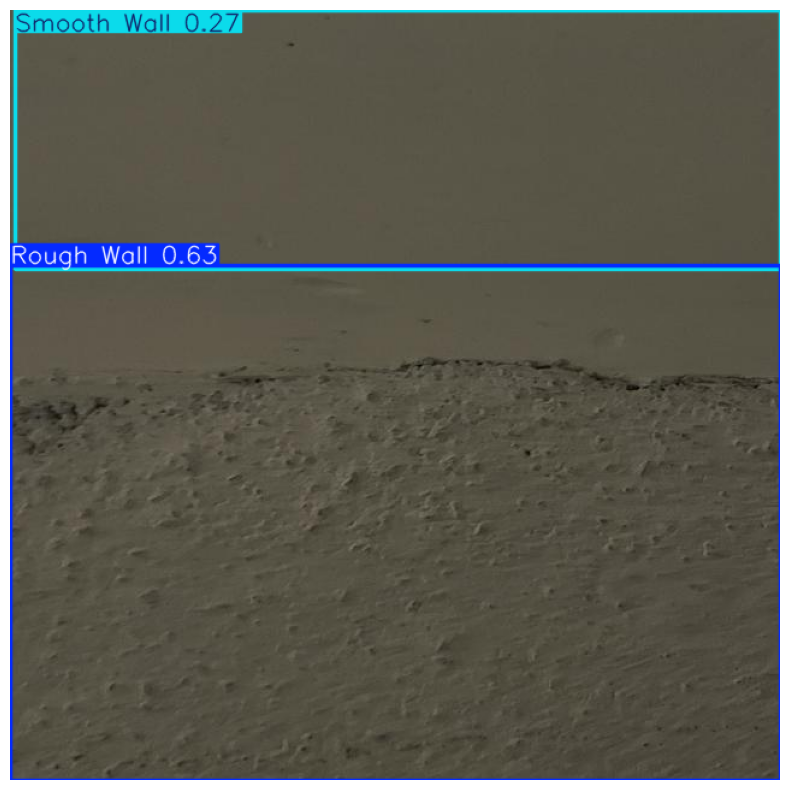

Image: IMG_7090_JPG.rf.da4cb3da033cd9070dffdac4938bb646.jpg
Edges: 3.02820068359375
Contour Complexity: 873
Gabor Std: 11.887102277165388
Smoothness Score: 19.524

Surface Category: Significant surface roughness detected. Multiple coats of paint and smoothing are recommended to achieve a smooth, even finish.


image 1/1 /content/drive/MyDrive/dataset1/test/images/20240122_102810_005_saved-1-_jpg.rf.cc751831da2d95cb52e61be6b3aeca3f.jpg: 640x640 1 Rough Wall, 20.8ms
Speed: 3.0ms preprocess, 20.8ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)


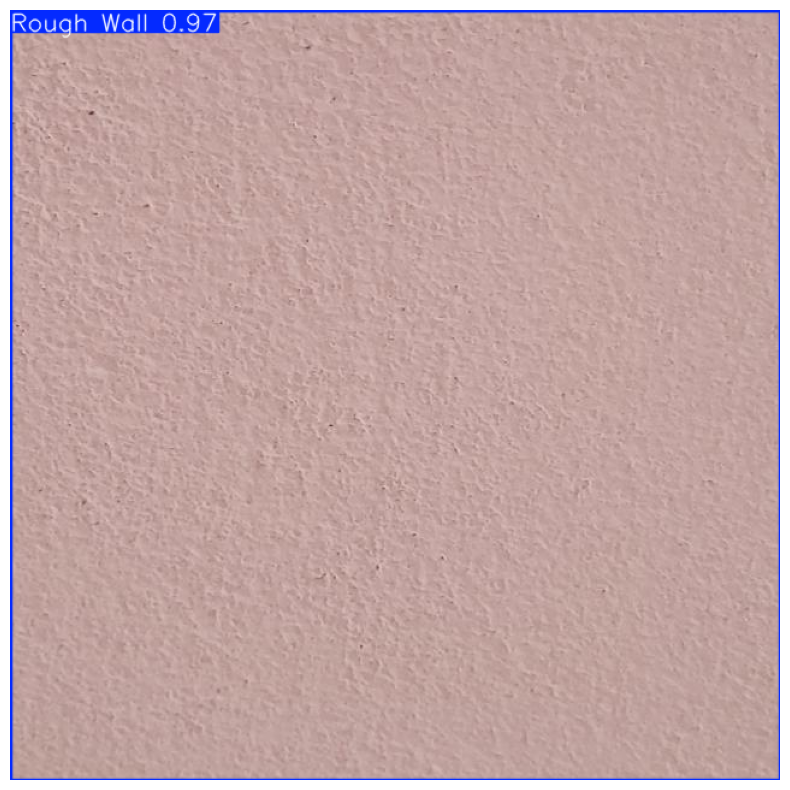

Image: 20240122_102810_005_saved-1-_jpg.rf.cc751831da2d95cb52e61be6b3aeca3f.jpg
Edges: 6.92759521484375
Contour Complexity: 863
Gabor Std: 14.949608090403933
Smoothness Score: 19.644

Surface Category: Significant surface roughness detected. Multiple coats of paint and smoothing are recommended to achieve a smooth, even finish.


image 1/1 /content/drive/MyDrive/dataset1/test/images/20240122_102259_jpg.rf.db75b63e77f7502f6a608fa82a5e2907.jpg: 640x640 (no detections), 16.4ms
Speed: 2.9ms preprocess, 16.4ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


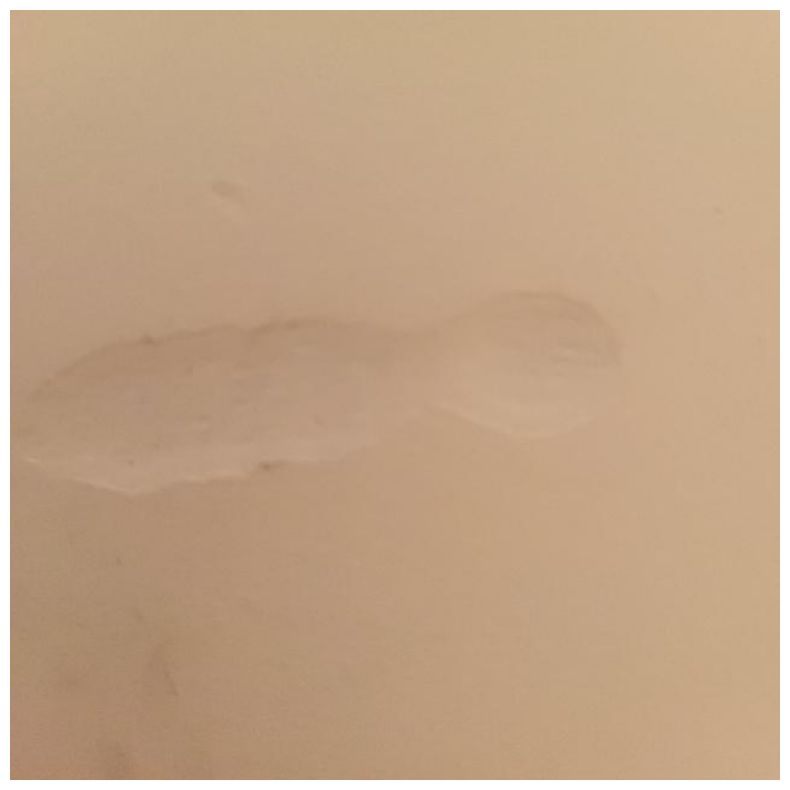

Image: 20240122_102259_jpg.rf.db75b63e77f7502f6a608fa82a5e2907.jpg
Edges: 0.85963134765625
Contour Complexity: 97
Gabor Std: 0.33562706926660224
Smoothness Score: 76.674

Surface Category: Surface exhibits mild roughness. A single coat of paint or light smoothing should be sufficient for an acceptable finish.


image 1/1 /content/drive/MyDrive/dataset1/test/images/20240122_103252_jpg.rf.5cc0da8597418efb55e633508e3c0039.jpg: 640x640 1 Rough Wall, 16.4ms
Speed: 7.0ms preprocess, 16.4ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


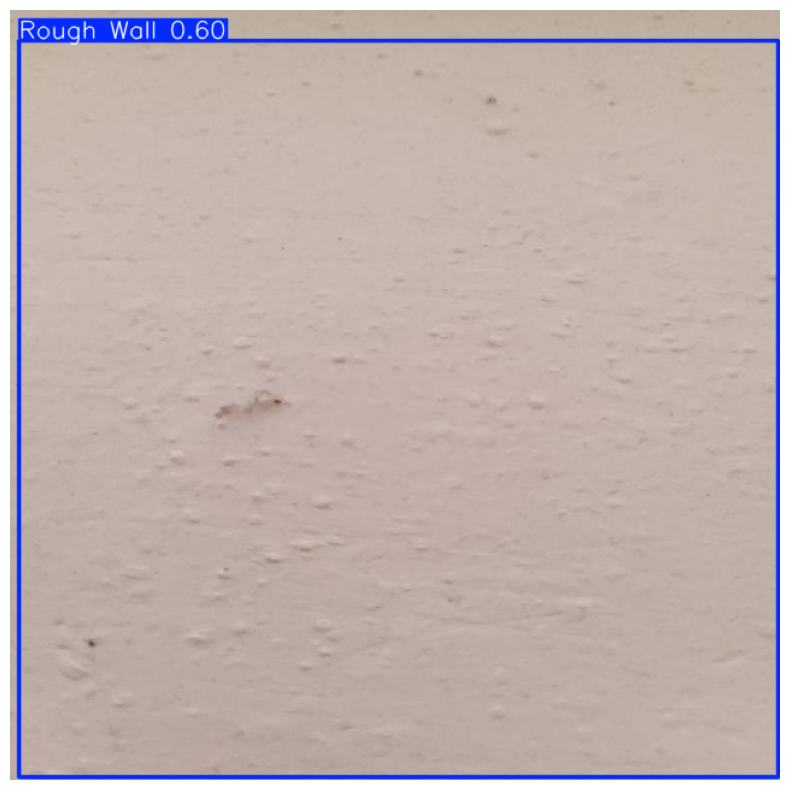

Image: 20240122_103252_jpg.rf.5cc0da8597418efb55e633508e3c0039.jpg
Edges: 1.88869873046875
Contour Complexity: 758
Gabor Std: 4.505494899063319
Smoothness Score: 34.676

Surface Category: Significant surface roughness detected. Multiple coats of paint and smoothing are recommended to achieve a smooth, even finish.


image 1/1 /content/drive/MyDrive/dataset1/test/images/IMG_7140_JPG.rf.f4b2702284e61be51691fed97ffa6ef7.jpg: 640x640 1 Rough Wall, 16.4ms
Speed: 2.9ms preprocess, 16.4ms inference, 5.3ms postprocess per image at shape (1, 3, 640, 640)


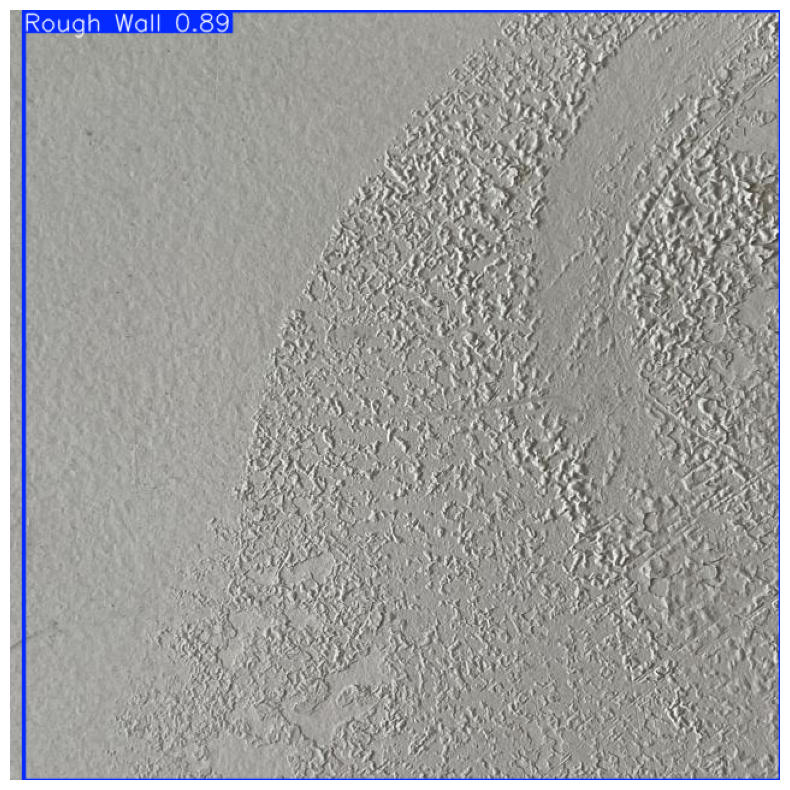

Image: IMG_7140_JPG.rf.f4b2702284e61be51691fed97ffa6ef7.jpg
Edges: 34.85574462890625
Contour Complexity: 74
Gabor Std: 47.23899758790927
Smoothness Score: 29.112

Surface Category: Significant surface roughness detected. Multiple coats of paint and smoothing are recommended to achieve a smooth, even finish.



In [24]:
import cv2
import numpy as np
import os
from ultralytics import YOLO
import matplotlib.pyplot as plt
from skimage.filters import gabor
from skimage.feature import canny

def compute_texture_features(image):
    """Compute Edge Density, Contour Complexity, and Gabor Features."""
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Laplacian Edge Density (Detects subtle dents)
    laplacian = cv2.Laplacian(gray, cv2.CV_64F)
    edge_density = np.sum(np.abs(laplacian)) / (gray.shape[0] * gray.shape[1])

    # Contour Complexity
    contours, _ = cv2.findContours(cv2.threshold(gray, 0, 255, cv2.THRESH_OTSU)[1], cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    contour_complexity = len(contours)

    # Gabor Features
    gabor_responses = []
    frequencies = [0.1, 0.3, 0.5]
    orientations = [0, 45, 90, 135]
    for frequency in frequencies:
        for orientation in orientations:
            filt_real, _ = gabor(gray, frequency=frequency, theta=np.deg2rad(orientation))
            gabor_responses.append(filt_real)
    gabor_mean = np.mean(np.stack(gabor_responses, axis=0), axis=0)

    return edge_density, contour_complexity, np.std(gabor_mean)

def compute_smoothness_score(image):
    """Calculate a normalized smoothness score (0-100)."""
    edge_density, contour_complexity, gabor_std = compute_texture_features(image)

    # Normalize each feature
    edge_norm = min(edge_density * 50, 100)
    contour_norm = min((contour_complexity / 2500) * 100, 100)
    gabor_norm = min(gabor_std * 10, 100)

    # Weighted Sum Formula for Smoothness Score
    smoothness_score = 100 - (0.5 * edge_norm + 0.3 * contour_norm + 0.2 * gabor_norm)
    smoothness_score = max(0, min(100, smoothness_score))  # Clamp the score

    return edge_density, contour_complexity, gabor_std, smoothness_score

# Load the trained YOLOv8 model
model = YOLO("/content/runs/detect/train/weights/best.pt")

# Path to the test images folder
test_images_folder = "/content/drive/MyDrive/dataset1/test/images/"
test_images = [img for img in os.listdir(test_images_folder) if img.lower().endswith(('.png', '.jpg', '.jpeg'))]

def categorize_surface(smoothness_score):
    """Categorize surface based on smoothness score."""
    if smoothness_score > 80:
        return "The surface is smooth with minimal imperfections. No further corrections are needed. The surface is ready for finishing or painting."
    elif smoothness_score > 60:
        return "Surface exhibits mild roughness. A single coat of paint or light smoothing should be sufficient for an acceptable finish."
    elif smoothness_score > 40:
        return "The surface shows moderate roughness. Two coats of paint or some level of smoothing may be required to ensure a satisfactory finish."
    else:
        return "Significant surface roughness detected. Multiple coats of paint and smoothing are recommended to achieve a smooth, even finish."

# Loop through each image in the test folder
for image_name in test_images:
    image_path = os.path.join(test_images_folder, image_name)
    image = cv2.imread(image_path)

    if image is not None:
        # YOLO Model Prediction (Bounding Boxes)
        results = model(image_path , conf=0.2)
        for r in results:
            im_array = r.plot()  # Plot the results
            plt.figure(figsize=(10, 10))
            plt.imshow(cv2.cvtColor(im_array, cv2.COLOR_BGR2RGB))
            plt.axis("off")
            plt.show()

        # Compute Smoothness Score
        edge_density, contour_complexity, gabor_std, smoothness_score = compute_smoothness_score(image)
        surface_category = categorize_surface(smoothness_score)

        # Output the results
        print(f"Image: {image_name}")
        print(f"Edges: {edge_density}")
        print(f"Contour Complexity: {contour_complexity}")
        print(f"Gabor Std: {gabor_std}")
        print(f"Smoothness Score: {smoothness_score:.3f}\n")
        print(f"Surface Category: {surface_category}\n")
